# Colorising historical Greyscale Airphoto with a Neural net

In [4]:
%%html
<iframe frameborder="0" width="100%" height="500" 
src="https://warrieka.github.io/histo_ortho_viewer/" ></iframe>

## Install the necessary libraries if needed

**REMARK**: check https://pytorch.org for the best option for your system,
Also make a separate environment for your system. 

In [ ]:
%pip install torch torchvision --index-url https://download.pytorch.org/whl/cu118
%pip install fastai
%pip install GDAL
%pip install timm
%pip install scikit-image
%pip install tqdm, IProgress 
%pip install pillow
%pip install matplotlib
%pip install pandas

import all the libraries

In [1]:
import time, os.path
import numpy as np
from osgeo import gdal
gdal.UseExceptions() # needs to be called so gdal will have readable exceptions
from pathlib import Path
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from skimage.color import rgb2lab, lab2rgb, rgb2gray
from skimage.io import imread
import torch, datetime
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader
import pandas as pd
from typing import Iterable

Based on https://towardsdatascience.com/colorizing-black-white-images-with-u-net-and-conditional-gan-a-tutorial-81b2df111cd8

In [3]:
%matplotlib inline 
import warnings
warnings.simplefilter("ignore", category=RuntimeWarning)
warnings.simplefilter('ignore', category=UserWarning)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
DEBUG = True

# Preprocessing

## Obtaining data

### Datasources
- Aerial photo's (Open data, from the Goverment or NGI):
    - Panchromatic: https://www.vlaanderen.be/datavindplaats/catalogus/orthofotos-middenschalig-zwart-wit-opname-1997-2000
    - Panchromatic: https://www.vlaanderen.be/datavindplaats/catalogus/orthofotomozaiek-kleinschalig-zomeropnamen-0 
    - RGB-colored, 2023: https://www.vlaanderen.be/datavindplaats/catalogus/orthofotowerkbestand-202303
    - RGB-colored, 2015: https://www.vlaanderen.be/datavindplaats/catalogus/grootschalige-orthofotomozaieken
    - ...
- Landuse: https://www.vlaanderen.be/datavindplaats/catalogus/bodembedekkingskaart-bbk-1m-resolutie-opname-2018 

### Tiling the sourcedata from JPEG2000 to Jpeg

Pytorch can't read jpeg2000 and the files are to large. 

GDAL has a fast tool to https://gdal.org/programs/gdal_retile.html this tool preserves the geographical properties and metadata in a csv-file, and allows also to write some overlap, this is nessary if you gonne apply convoltions on the data. Files with only nodata are ommitted. 

For each jpeg2000 write a collection of tiles and index csv-file that describes these files.
For example for the files of 2023, in powershell: 
```ps1
foreach ($G in ls W:\2023\*.jp2 ){ 
    gdal_retile -co WORLDFILE=YES -overlap 100 -ps 512 512 -csv "W:\\2023_tiles\\$($G.Basename).csv" -f JPEG -ot Byte -targetDir "W:\\2023_tiles" $G.fullname
}
```

For the 0.15 meter resolution photo's of 2023 this give us 2626657 files.  

## The making of a weigthed dataset

We wil use the Flemish landuse dataset 'Bodem Bedekkings Kaart (BBK)" from the Flemish Goverment:  
https://www.vlaanderen.be/datavindplaats/catalogus/bodembedekkingskaart-bbk-1m-resolutie-opname-2018

The BBK is a Segmentation map derived from the Multispectral (RGB-NIR) aerial images that shows the land cover in Flanders. Based on pixel classification supplemented with vectorial ground truth data, data is divided into low green, agricultural, forest, waterway and buildings. The target audience of these maps at resolution 1m and 5m is the general user who wants to consult a land cover map of Flanders as a basis for various analyzes relating to land cover or land use.

This map has 14 broad catergories + 0 for no data (usually not in Flanders): 

1) Buildings
2) Roads
3) Other constructed
4) Railroads
5) Water
6) Other Natural
7) Field - Agriculture
8) Grass - Bushes (Nature)
9)  Trees (Nature)
10) Grass Bushes (Agriculture)
11) Grass Bushes (Road Edge)
12) Trees (Road edge)
13) Grass Bushes (Water Edge)
14) Trees (Water Edge)

<img src="pic/BBK18.png" 
alt="A colored image of the BBK" 
title="A colored image of the BBK" width="350" height="auto">

We sample for the extend of every photo for the dominant Category. We use the tool Zonal statistics is QGIS for this: https://docs.qgis.org/3.34/en/docs/user_manual/processing_algs/qgis/rasteranalysis.html#qgiszonalstatisticsfb

The result is saved to arrow-file. 

Below you you see this file on of the traindata yellow for agriculture types, green for natural types, blue for water and reds for constructed types.

<img src="pic/BBK18_reclass.png" 
alt="A colored image of the BBK" 
title="A colored image of the BBK" width="480" height="auto">

In [5]:
BBK_CATEGORIES = {
    # 0: "Out of scope, onbekend",
    1: "Gebouwen",
    2: "Autowegen",
    3: "Overig Afgedekt",
    4: "Spoorwegen",
    5: "Water",
    6: "Overig Onafgedekt",
    7: "Akker (Landbouw)",
    8: "Gras  Struiken (Groen)",
    9: "Bomen (Groen)",
    10: "Gras  Struiken (Landbouw)",
    11: "Gras  Struiken (Wegrand)" ,
    12: "Bomen (Wegrand)" ,
    13: "Gras  Struiken (Waterrand)",
    14: "Bomen (Waterrand)"}

grouped_categories=  {"UNKNOWN": [0], "BUILDING": [1], "ROADLIKE":[2,3,4], "GREEN": [6,8,10,11], 
                      "AGRO": [7], "WOOD": [9,12], "WATER":[5,13,14] }

In [6]:
ds = pd.read_feather(r"W:\1989_tiles\index_landuse.arrow") # r"W:\2023_tiles\2023tiles_landuse.arrow") # r"W:\2015_tiles\2015tiles_landuse.arrow")
#group this to a few simpler categories
ds["CATEGORY"] = ds["BBK_CAT"].map({v: k for k,vv in grouped_categories.items() for v in vv})
ds["CATEGORY"] = ds["CATEGORY"].astype("category")
ds["BBK_CAT"] = ds["BBK_CAT"].astype("category")
ds["BBK_CAT"]= ds["BBK_CAT"].cat.rename_categories(BBK_CATEGORIES.values())
ds[["path", "BBK_CAT","CATEGORY"]].sample(5)

,path,BBK_CAT,CATEGORY
292613,W:\2015_tiles\K127n\OGWRGB13_15VL_K127n_19_32.jpg,Gras Struiken (Landbouw),GREEN
717788,W:\2015_tiles\K205n\OGWRGB13_15VL_K205n_14_68.jpg,Gras Struiken (Landbouw),GREEN
942831,W:\2015_tiles\K243n\OGWRGB13_15VL_K243n_18_72.jpg,Bomen (Groen),WOOD
774678,W:\2015_tiles\K214z\OGWRGB13_15VL_K214z_24_18.jpg,Akker (Landbouw),AGRO
509148,W:\2015_tiles\K164n\OGWRGB13_15VL_K164n_11_39.jpg,Akker (Landbouw),AGRO


Also check if files exist on drive and remove files that don't exist or are moro then half black (=nodata).

In [ ]:
ds = ds[ds["path"].apply(lambda x: os.path.exists(x) and np.median( imread(x) ) != 0 ) ]
ds.reset_index(inplace=True)

Calulate the percentage of occurrences of a CATEGORY

Text(0, 0.5, '%')

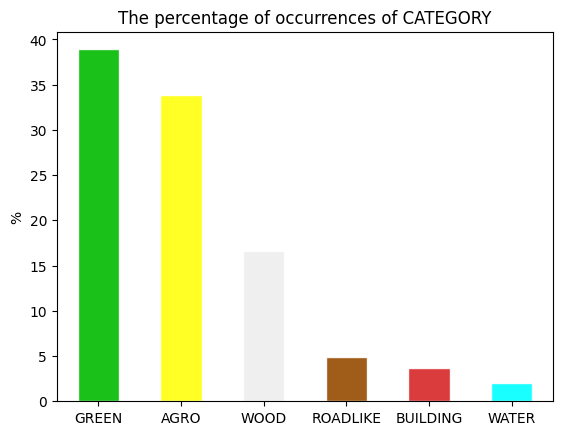

In [8]:
ax = (100* ds.CATEGORY.value_counts() / ds.CATEGORY.count()).plot(
    edgecolor='#fff', kind='bar',alpha=0.9, rot=0,                                                     
    color =['#0b0', '#ffff0e','#eee', '#964B00',  '#d62728',  '#0ff', '#f0f'])

ax.set_title('The percentage of occurrences of CATEGORY')
ax.set_xlabel(None)
ax.set_ylabel('%')

We can use these inverse value counts as weigths on these tiles. So the less a values common a value, the more likely it will be picked in weigthed sampling.   

In [9]:
weights = 1/ds["CATEGORY"].value_counts()
weights

CATEGORY
GREEN       0.000002
AGRO        0.000002
WOOD        0.000005
ROADLIKE    0.000016
BUILDING    0.000021
WATER       0.000039
Name: count, dtype: float64

In [45]:
# set as WEIGHT for readability and performance convert integer 
ds['WEIGHT'] = ds['CATEGORY'].map( weights*10e6 ).astype('int32')
# you can use this field to sample this dataset in balanced manner, 
# replace is False so a photo won't be picked twice. 
ds.sample(5,  weights='WEIGHT', replace=False)[['path',"BBK_CAT","CATEGORY","WEIGHT"]]

,path,BBK_CAT,CATEGORY,WEIGHT
179228,W:\2015_tiles\K085z\OGWRGB13_15VL_K085z_25_01.jpg,Akker (Landbouw),AGRO,23
798295,W:\2015_tiles\K217z\OGWRGB13_15VL_K217z_39_01.jpg,Akker (Landbouw),AGRO,23
884467,W:\2015_tiles\K233n\OGWRGB13_15VL_K233n_39_61.jpg,Gras Struiken (Waterrand),WATER,387
1093354,W:\2015_tiles\K267z\OGWRGB13_15VL_K267z_10_38.jpg,Akker (Landbouw),AGRO,23
86016,W:\2015_tiles\K065z\OGWRGB13_15VL_K065z_45_22.jpg,Akker (Landbouw),AGRO,23


In [46]:
# since water is mostly featureless, lets lower its weight a bit more
ds.loc[ds.CATEGORY == 'WATER', 'WEIGHT'] = ds.loc[ds.CATEGORY == 'WATER', 'WEIGHT'] // 3

# as well for unknown
ds.loc[ds.CATEGORY == 'UNKNOWN', 'WEIGHT'] = ds.loc[ds.CATEGORY == 'UNKNOWN', 'WEIGHT'] // 3

In [47]:
ds.WEIGHT.unique()

array([ 23,  46,  20, 160, 210, 129])

In [65]:
ds.sample(10,  weights='WEIGHT', replace=False)[['path',"BBK_CAT","CATEGORY","WEIGHT"]]

,path,BBK_CAT,CATEGORY,WEIGHT
369338,W:\2015_tiles\K141n\OGWRGB13_15VL_K141n_43_05.jpg,Akker (Landbouw),AGRO,23
1274885,W:\2015_tiles\K305z\OGWRGB13_15VL_K305z_40_04.jpg,Bomen (Groen),WOOD,46
783289,W:\2015_tiles\K215z\OGWRGB13_15VL_K215z_38_49.jpg,Gras Struiken (Groen),GREEN,20
872012,W:\2015_tiles\K231z\OGWRGB13_15VL_K231z_24_08.jpg,Water,WATER,129
474967,W:\2015_tiles\K157z\OGWRGB13_15VL_K157z_05_22.jpg,Gebouwen,BUILDING,210
255195,W:\2015_tiles\K118z\OGWRGB13_15VL_K118z_29_41.jpg,Akker (Landbouw),AGRO,23
1129828,W:\2015_tiles\K282z\OGWRGB13_15VL_K282z_04_27.jpg,Overig Afgedekt,ROADLIKE,160
1205696,W:\2015_tiles\K294z\OGWRGB13_15VL_K294z_17_01.jpg,Gras Struiken (Landbouw),GREEN,20
982207,W:\2015_tiles\K248n\OGWRGB13_15VL_K248n_43_58.jpg,Gras Struiken (Landbouw),GREEN,20
582338,W:\2015_tiles\K175z\OGWRGB13_15VL_K175z_37_65.jpg,Water,WATER,129


Save the results back to an arrow file. 
Then repeat this flow for 2015 and 2023. 

In [66]:
ds[['path',"BBK_CAT","CATEGORY","WEIGHT"]].to_feather('.\\data\\tiles_1989_weighted.arrow', compression='lz4')

### Merging Results

The resulting arrow files saved are added to project. 

We have about 60000 images from 1989 at a ground resolution of 1m, 1,65 million form 2015 at resolution 25cm and 2,62 million from 2023 at a resolution 15cm. While the resolution of 2023 is higher then 2015 the quality is lower. So we also reduce its importance a bit.  

The dataset is derived from scanned color images, while 2015 and 2023 are taken digitally. So this dataset needs to be pulled from the source 

In [3]:
df1989 = pd.read_feather("data\\tiles_1989_weighted.arrow")
df1989.sample(4,  weights='WEIGHT')

,path,BBK_CAT,CATEGORY,WEIGHT
17861,W:\1989_tiles\OKZRGB79_90VL_K16\OKZRGB79_90VL_...,Gras Struiken (Groen),GREEN,5
58613,W:\1989_tiles\OKZRGB79_90VL_K39\OKZRGB79_90VL_...,Akker (Landbouw),AGRO,4
45809,W:\1989_tiles\OKZRGB79_90VL_K29\OKZRGB79_90VL_...,Autowegen,ROADLIKE,69
21418,W:\1989_tiles\OKZRGB79_90VL_K17\OKZRGB79_90VL_...,Overig Afgedekt,ROADLIKE,69


In [4]:
df2015 = pd.read_feather("data\\tiles_2015_weighted.arrow")
df2015.sample(4, weights='WEIGHT')

,path,BBK_CAT,CATEGORY,WEIGHT
819860,W:\2015_tiles\K222z\OGWRGB13_15VL_K222z_27_38.jpg,Akker (Landbouw),AGRO,23
571965,W:\2015_tiles\K174n\OGWRGB13_15VL_K174n_48_66.jpg,Spoorwegen,ROADLIKE,160
1455586,W:\2015_tiles\K336n\OGWRGB13_15VL_K336n_04_57.jpg,Gebouwen,BUILDING,210
386341,W:\2015_tiles\K143z\OGWRGB13_15VL_K143z_21_04.jpg,Akker (Landbouw),AGRO,23


In [5]:
df2023 = pd.read_feather("data\\tiles_2023_weighted.arrow")
df2023.sample(4, weights='WEIGHT')

,index,path,BBK_CAT,CATEGORY,WEIGHT
2038408,2281336,W:\2023_tiles\K327n\OMWRGBMRVL_K327n_58_80.jpg,Akker (Landbouw),AGRO,16
1709589,1933173,W:\2023_tiles\K293n\OMWRGBMRVL_K293n_14_01.jpg,Overig Afgedekt,ROADLIKE,52
887226,1041295,W:\2023_tiles\K187n\OMWRGBMRVL_K187n_57_14.jpg,Akker (Landbouw),AGRO,16
617578,760235,W:\2023_tiles\K157n\OMWRGBMRVL_K157n_08_15.jpg,Water,WATER,38


In [6]:
df2023.WEIGHT = df2023.WEIGHT //2
df1989.WEIGHT = df2023.WEIGHT *30

In [7]:
df = pd.concat([df1989, df2015, df2023], ignore_index=True)

In [9]:
df[["path","BBK_CAT","CATEGORY","WEIGHT"]].sample(25,  weights='WEIGHT', replace=False)

,path,BBK_CAT,CATEGORY,WEIGHT
2574101,W:\2023_tiles\K231z\OMWRGBMRVL_K231z_27_21.jpg,Gebouwen,BUILDING,44
29305,W:\1989_tiles\OKZRGB79_90VL_K21\OKZRGB79_90VL_...,Akker (Landbouw),AGRO,1320
494807,W:\2015_tiles\K173z\OGWRGB13_15VL_K173z_04_54.jpg,Overig Afgedekt,ROADLIKE,160
291307,W:\2015_tiles\K136z\OGWRGB13_15VL_K136z_43_32.jpg,Bomen (Groen),WOOD,46
1853191,W:\2023_tiles\K146n\OMWRGBMRVL_K146n_59_30.jpg,Water,WATER,19
2659380,W:\2023_tiles\K238z\OMWRGBMRVL_K238z_20_61.jpg,Akker (Landbouw),AGRO,8
657942,W:\2015_tiles\K212z\OGWRGB13_15VL_K212z_07_56.jpg,Gras Struiken (Landbouw),GREEN,20
810922,W:\2015_tiles\K236z\OGWRGB13_15VL_K236z_48_78.jpg,Gras Struiken (Groen),GREEN,20
28133,W:\1989_tiles\OKZRGB79_90VL_K21\OKZRGB79_90VL_...,Akker (Landbouw),AGRO,570
1264204,W:\2015_tiles\K334n\OGWRGB13_15VL_K334n_32_44.jpg,Bomen (Groen),WOOD,46


In [10]:
df.to_feather("data\\tiles_merged.arrow",  compression='lz4')

#  DATASET

In [64]:
def makeWeightedDataFromArrow(arrow, train_size=4000, test_size=1000,
                    pathField='NAME', weightField='WEIGHT', replacement=False):
    ds= pd.read_feather(arrow)
    train_paths = ds.sample(train_size, weights=weightField, replace=replacement)[pathField]
    test_paths = ds.sample(test_size, weights=weightField, replace=replacement)[pathField]
    return list(train_paths), list(test_paths)


In [65]:
train_paths, val_paths = makeWeightedDataFromArrow(
    r'.\data\tiles_2015_Weighted.arrow', train_size=160, test_size=40, 
    pathField='path', weightField='WEIGHT', replacement=False)
print(len(train_paths), len(val_paths))

160 40


## Augmentation

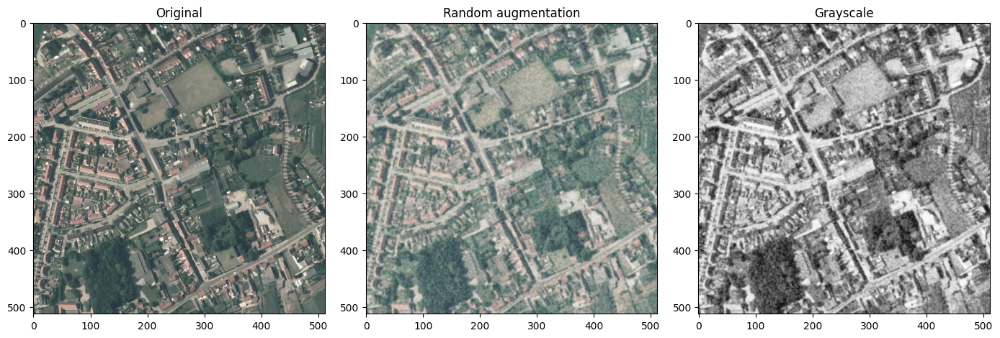

In [7]:
from skimage.exposure import adjust_gamma, adjust_sigmoid
from skimage.util import random_noise
from skimage.filters import gaussian
from skimage.transform import resize

def grainify(img:np.ndarray):
    "Make it grainy like an old photo"
    c, rows, cols = img.shape
    val = np.random.uniform(0.036, 0.107)**2 

    # Full resolution
    noise_1 = np.zeros((rows, cols))
    noise_1 = random_noise(noise_1, mode='gaussian', var=val, clip=False)

    # # Half resolution
    noise_2 = np.zeros((rows//2, cols//2))
    noise_2 = random_noise(noise_2, mode='gaussian', var=(val*2)**2, clip=False)  
    noise_2 = resize(noise_2, (rows, cols))  # Upscale to original image size

    noise = noise_1 + noise_2 
    noise = np.stack( [noise]*c, axis=0)
    
    noisy_img = img/255 + noise # Add noise_im to the input image.
    return np.round((255 * noisy_img)).clip(0, 255).astype(np.uint8)

def aug(img:np.ndarray):
    "some data augmentation on img "
    img = adjust_gamma(img, gamma=np.random.uniform(low=0.5, high=1.5) ) #change lighting
    img = grainify(img)   #Make it grainy like an old photo
    img = adjust_sigmoid(img, gain= np.random.uniform(1,10) ) #contrast
    img = gaussian(img, np.random.uniform(0,1.5), channel_axis=0 ) # blur
    return (img*255).astype('uint8')

# Load random image using GDAL
imagePath = str( Path(r"W:\1979_tiles\OKZRGB79_90VL_K23\OKZRGB79_90VL_K23_0_9.png") )
image = gdal.Open(imagePath).ReadAsArray(buf_xsize=512, buf_ysize=512) #1pix == 1 meter

# Apply the transformation to your image
aug_image = aug(image)

fig,axs= plt.subplots(1,3)
axs[0].imshow( image.transpose((1, 2, 0)) )
axs[0].set_title('Original')
axs[1].imshow( aug_image.transpose((1, 2, 0))  )
axs[1].set_title('Random augmentation')
axs[2].imshow(  rgb2gray(aug_image , channel_axis=0 ) , cmap='Greys_r'  )
axs[2].set_title('Grayscale')
fig.set_size_inches(14,42)
fig.tight_layout()

In [67]:
class ColorizationDataset(Dataset):
    def __init__(self, paths:Iterable[os.PathLike], imsize:int=256, rootDir:str='', resize:bool=True):
        super().__init__()
        self.size = imsize
        self.paths = paths
        self.root = rootDir
        self.resize = resize

    def __getitem__(self, idx:int):
        imagePath = str(Path(self.root) / self.paths[idx]) 
        img = gdal.Open(imagePath).ReadAsArray(buf_xsize=self.size, buf_ysize=self.size) 
        img = aug(img)                              
        img_lab = rgb2lab( img , channel_axis=0 ) # Converting RGB to L*a*b
        img_lab = torch.tensor(img_lab, dtype=torch.float32) # Convert to Tensor
       
        L =  (img_lab[0] / 50. - 1).unsqueeze(0) # Between -1 and 1
        ab = img_lab[1:3] / 110  # Between -1 and 1
        return {'L': L, 'ab': ab}
    
    def __len__(self):
        return len(self.paths)

In [69]:
pretrain_dl = DataLoader(ColorizationDataset(train_paths, imsize=256), batch_size=8)
val_dl      = DataLoader(ColorizationDataset(val_paths, imsize=256), batch_size=4)

In [70]:
data = next(iter(val_dl))
Ls, abs_ = data['L'], data['ab']

print(Ls.shape, abs_.shape)
print(len(pretrain_dl), len(val_dl), len(train_paths), len(val_paths))

torch.Size([4, 1, 256, 256]) torch.Size([4, 2, 256, 256])
20 10 160 40


# Generator

In [3]:
from fastai.vision.learner import create_body
from fastai.vision.models.unet import DynamicUnet
import timm 

def ResUnet(n_input=1, n_output=2, size=224, timm_model_name='resnet18'):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = timm.create_model(timm_model_name, pretrained=True)
    body = create_body(model, pretrained=True, n_in=n_input, cut=-2)
    net_G = DynamicUnet(body, n_output, (size, size)).to(device)
    return net_G


## Pretrain Generator

You can pretrain the generator a little by running a few image trough it,<br> 
but without a discriminator this will not deliver good results.

In [4]:
class statsMeter:
    def __init__(self):
        self.reset()
        
    def reset(self):
        self.count, self.avg, self.sum = [0.] * 3
    
    def update(self, val, count=1):
        self.count += count
        self.sum += count * val
        self.avg = self.sum / self.count

In [5]:
def pretrain_generator(net_G, pretrain_dl, epochs, lrate=1e-3):
    opt = optim.Adam(net_G.parameters(), lr=lrate)
    criterion = nn.L1Loss() 
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    print(f"Started pretraining at {datetime.datetime.now()}")
    for e in range(epochs):
        loss_meter = statsMeter()
        for data in pretrain_dl:
            L, ab = data['L'].to(device), data['ab'].to(device)
            preds = net_G(L)
            loss = criterion(preds, ab)
            opt.zero_grad()
            loss.backward()
            opt.step()
            loss_meter.update(loss.item(), L.size(0))
            
        print(f"Epoch {e + 1}/{epochs}")
        print(f"L1 Loss: {loss_meter.avg:.5f}")

    print(f"Finished pretraining at {datetime.datetime.now()}")
    
    return net_G

In [95]:

net_G = ResUnet(n_input=1, n_output=2, size=256)
net_G = pretrain_generator(net_G, pretrain_dl, epochs=5)
torch.save(net_G.state_dict(), "runs\\demo\\res18-unet_demo.pt")

Started pretraining at 2024-01-03 11:32:33.917362
Epoch 1/5
L1 Loss: 5204.15472
Epoch 2/5
L1 Loss: 0.02970
Epoch 3/5
L1 Loss: 0.00766
Epoch 4/5
L1 Loss: 0.00620
Epoch 5/5
L1 Loss: 0.00640
Finished pretraining at 2024-01-03 11:33:11.607399


## Test Unet before GAN training

In [96]:
img_test = list( Path(r"W:\testdata\tiles_1950_gray").glob('*.png') )
randImg = lambda: str( img_test[ np.random.randint(0, len(img_test) ) ]) 

resunet = ResUnet()
state_dict = torch.load(Path(".\\runs\\demo\\res18-unet_demo.pt"), map_location=device)
resunet.load_state_dict(state_dict)

<All keys matched successfully>

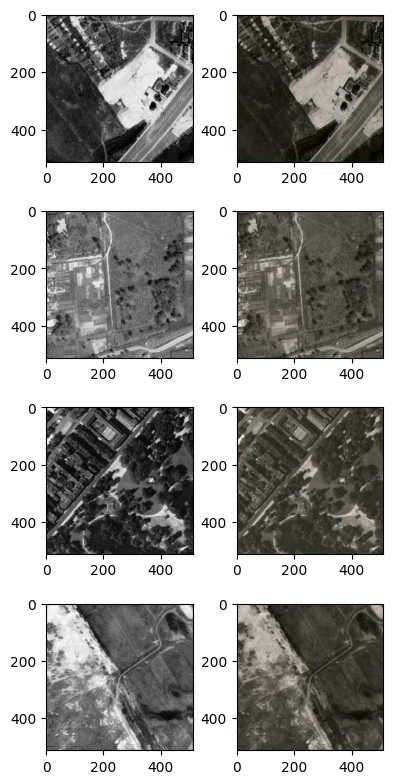

In [97]:
from model.tools import lab_to_rgb

testSet  = []
for i in range(4):
   ds =gdal.Open( randImg())
   b1 = torch.Tensor( ( ds.GetRasterBand(1).ReadAsArray() /128) -1 ).unsqueeze(0)
   testSet.append(b1.unsqueeze(0))

testSet = torch.cat(testSet)

f, axs= plt.subplots(4,2)
axs[0][0].imshow(testSet[0][0], cmap='Greys_r')
axs[1][0].imshow(testSet[1][0], cmap='Greys_r')
axs[2][0].imshow(testSet[2][0], cmap='Greys_r')
axs[3][0].imshow(testSet[3][0], cmap='Greys_r')

with torch.inference_mode():
   w= resunet(testSet.to(device))

colorized = lab_to_rgb(testSet, w.cpu())
axs[0][1].imshow(colorized[0])
axs[1][1].imshow(colorized[1])
axs[2][1].imshow(colorized[2])
axs[3][1].imshow(colorized[3])

f.set_size_inches(4,8)
f.tight_layout()

# Patch Discriminator

In [98]:
class PatchDiscriminator(nn.Module):
    def __init__(self, input_c, num_filters=64, n_down=3):
        super().__init__()
        model = [self.get_layers(input_c, num_filters, norm=False)]
        model += [self.get_layers(num_filters * 2 ** i, num_filters * 2 ** (i + 1), s=1 if i == (n_down-1) else 2) 
                          for i in range(n_down)] # the 'if' statement is taking care of not using
                                                  # stride of 2 for the last block in this loop
        model += [self.get_layers(num_filters * 2 ** n_down, 1, 
                                  s=1, norm=False, act=False)] # Make sure to not use normalization or
                                                            # activation for the last layer of the model
        self.model = nn.Sequential(*model)                                                   
        
    def get_layers(self, ni, nf, k=4, s=2, p=1, norm=True, act=True): # when needing to make some repeatitive blocks of layers,
        layers = [nn.Conv2d(ni, nf, k, s, p, bias=not norm)]          # it's always helpful to make a separate method for that purpose
        if norm: layers += [nn.BatchNorm2d(nf)]
        if act: layers += [nn.LeakyReLU(0.2, True)]
        return nn.Sequential(*layers)
    
    def forward(self, x):
        return self.model(x)

# GAN Loss

In [112]:
class GANLoss(nn.Module):
    def __init__(self, gan_mode='vanilla', real_label=1.0, fake_label=0.0):
        super().__init__()
        self.register_buffer('real_label', torch.tensor(real_label))
        self.register_buffer('fake_label', torch.tensor(fake_label))
        self.loss = nn.BCEWithLogitsLoss()
    
    def get_labels(self, preds, target_is_real):
        if target_is_real:
            labels = self.real_label
        else:
            labels = self.fake_label
        return labels.expand_as(preds)
    
    def __call__(self, preds, target_is_real):
        labels = self.get_labels(preds, target_is_real)
        loss = self.loss(preds, labels)
        return loss

# Main

In [113]:
class MainModel(nn.Module):
    def __init__(self, lr_G=2e-4, lr_D=2e-4, 
                 beta1=0.5, beta2=0.999, lambda_L1=100.):
        super().__init__()
        
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.lambda_L1 = lambda_L1

        self.net_G = ResUnet().to(self.device)
        self.net_D = self.init_weights(PatchDiscriminator(input_c=3, n_down=3, num_filters=64)).to(self.device)
        self.GANcriterion = GANLoss(torch.float32).to(self.device)
        self.L1criterion =  nn.L1Loss()
        self.opt_G = optim.Adam(self.net_G.parameters(), lr=lr_G, betas=(beta1, beta2))
        self.opt_D = optim.Adam(self.net_D.parameters(), lr=lr_D, betas=(beta1, beta2))
    
    def init_weights(self, net, gain:float=0.02):
        def init_func(m):
            classname = m.__class__.__name__
            if hasattr(m, 'weight') and 'Conv' in classname:
                nn.init.kaiming_normal_(m.weight.data, a=0, mode='fan_in')
                if hasattr(m, 'bias') and m.bias is not None:
                    nn.init.constant_(m.bias.data, 0.0)
            elif 'BatchNorm2d' in classname:
                nn.init.normal_(m.weight.data, 1., gain)
                nn.init.constant_(m.bias.data, 0.)

        net.apply(init_func)
        return net

    def set_requires_grad(self, model, requires_grad=True):
        for p in model.parameters():
            p.requires_grad = requires_grad
        
    def setup_input(self, data):
        self.L = data['L'].to(self.device)
        self.ab = data['ab'].to(self.device)
        
    def forward(self):
        self.fake_color = self.net_G(self.L)
    
    def backward_D(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image.detach())
        self.loss_D_fake = self.GANcriterion(fake_preds, False)
        real_image = torch.cat([self.L, self.ab], dim=1)
        real_preds = self.net_D(real_image)
        self.loss_D_real = self.GANcriterion(real_preds, True)
        self.loss_D = (self.loss_D_fake + self.loss_D_real) * 0.5
        self.loss_D.backward()
    
    def backward_G(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image)
        self.loss_G_GAN = self.GANcriterion(fake_preds, True)
        self.loss_G_L1 = self.L1criterion(self.fake_color, self.ab) * self.lambda_L1
        self.loss_G = self.loss_G_GAN + self.loss_G_L1
        self.loss_G.backward()
    
    def optimize(self):
        self.forward()
        self.net_D.train()
        self.set_requires_grad(self.net_D, True)
        self.opt_D.zero_grad()
        self.backward_D()
        self.opt_D.step()
        
        self.net_G.train()
        self.set_requires_grad(self.net_D, False)
        self.opt_G.zero_grad()
        self.backward_G()
        self.opt_G.step()


# Train

### Utils 

In [124]:
def create_loss_meters():
    loss_D_fake = statsMeter()
    loss_D_real = statsMeter()
    loss_D = statsMeter()
    loss_G_GAN = statsMeter()
    loss_G_L1 = statsMeter()
    loss_G = statsMeter()
    
    return {'loss_D_fake': loss_D_fake,
            'loss_D_real': loss_D_real,
            'loss_D': loss_D,
            'loss_G_GAN': loss_G_GAN,
            'loss_G_L1': loss_G_L1,
            'loss_G': loss_G}

def update_losses(model, loss_meter_dict, count):
    for loss_name, loss_meter in loss_meter_dict.items():
        loss = getattr(model, loss_name)
        loss_meter.update(loss.item(), count=count)

def lab_to_rgb(L, ab):
    """
    Takes a batch of images
    """
    
    L = (L + 1.) * 50.
    ab = ab * 110.
    Lab = torch.cat([L, ab], dim=1).permute(0, 2, 3, 1).cpu().numpy()
    rgb_imgs = []
    for img in Lab:
        img_rgb = lab2rgb(img)
        rgb_imgs.append(img_rgb)
    return np.stack(rgb_imgs, axis=0)
    
def visualize(model, data, save=True):
    model.net_G.eval()
    with torch.no_grad():
        model.setup_input(data)
        model.forward()
    model.net_G.train()
    fake_color = model.fake_color.detach()
    real_color = model.ab
    L = model.L
    fake_imgs = lab_to_rgb(L, fake_color)
    real_imgs = lab_to_rgb(L, real_color)
    fig = plt.figure(figsize=(15, 8))
    for i in range(4):
        ax = plt.subplot(3, 5, i + 1)
        ax.imshow(L[i][0].cpu(), cmap='gray')
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 5)
        ax.imshow(fake_imgs[i])
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 10)
        ax.imshow(real_imgs[i])
        ax.axis("off")
    plt.show()
    if save:
        fig.savefig(f"colorization_{time.time()}.png")
        
def log_results(loss_meter_dict):
    for loss_name, loss_meter in loss_meter_dict.items():
        print(f"{loss_name}: {loss_meter.avg:.4f}")

### Training

In [122]:
def train_model(model, train_dl, epochs):
    model.train() 
     # getting a batch for visualizing the model output after fixed intrvals
    for e in range(epochs):
        loss_meter_dict = create_loss_meters() # function returing a dictionary of objects to 
                          
        for data in train_dl:
            model.setup_input(data) 
            model.optimize()
            batchsize = data['L'].size(0)
            update_losses(model, loss_meter_dict, count=batchsize) # function updating the log objects

        print(f"\nEpoch {e+1}/{epochs}") 
        log_results(loss_meter_dict) # function to print out the losses
        test_data = next(iter(val_dl))
        visualize(model, test_data, save=False) # function displaying the model's outputs

In [120]:
model = MainModel()


Epoch 1/5
loss_D_fake: 0.4419
loss_D_real: 0.4319
loss_D: 0.4369
loss_G_GAN: 1.3350
loss_G_L1: 4.6299
loss_G: 5.9649


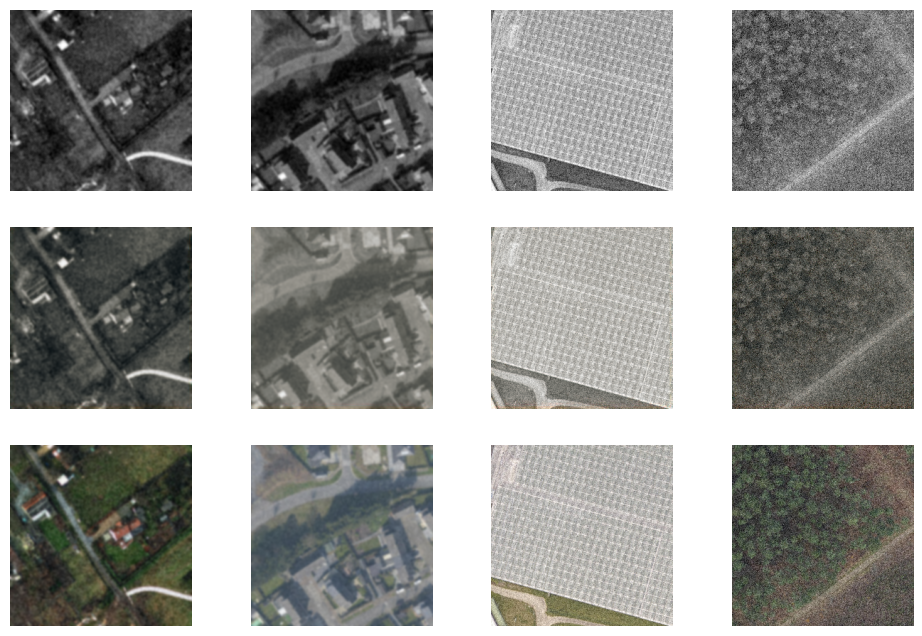


Epoch 2/5
loss_D_fake: 0.4540
loss_D_real: 0.4412
loss_D: 0.4476
loss_G_GAN: 1.3924
loss_G_L1: 4.9903
loss_G: 6.3826


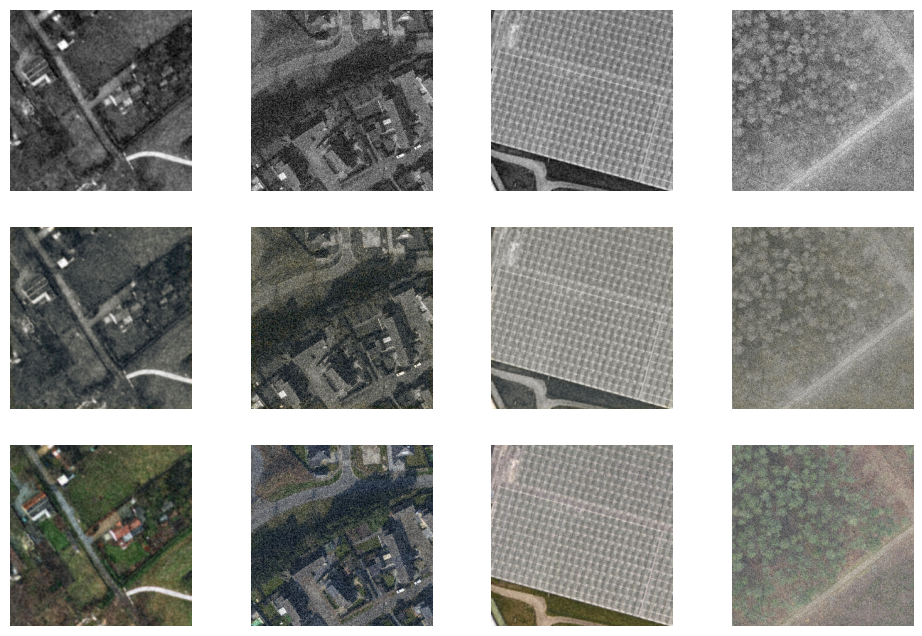


Epoch 3/5
loss_D_fake: 0.6094
loss_D_real: 0.5500
loss_D: 0.5797
loss_G_GAN: 1.2045
loss_G_L1: 4.9443
loss_G: 6.1488


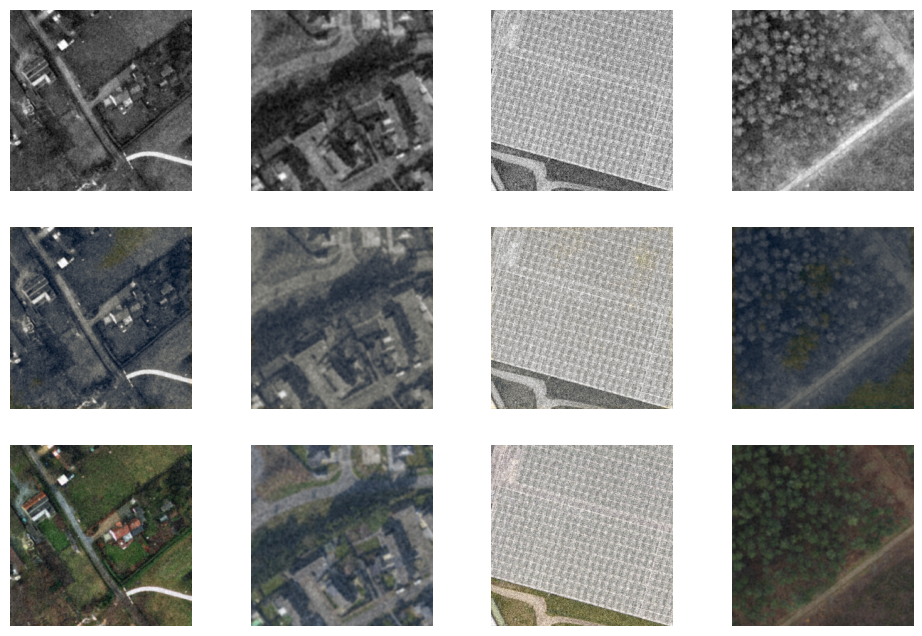


Epoch 4/5
loss_D_fake: 0.5511
loss_D_real: 0.5669
loss_D: 0.5590
loss_G_GAN: 1.1266
loss_G_L1: 4.6503
loss_G: 5.7769


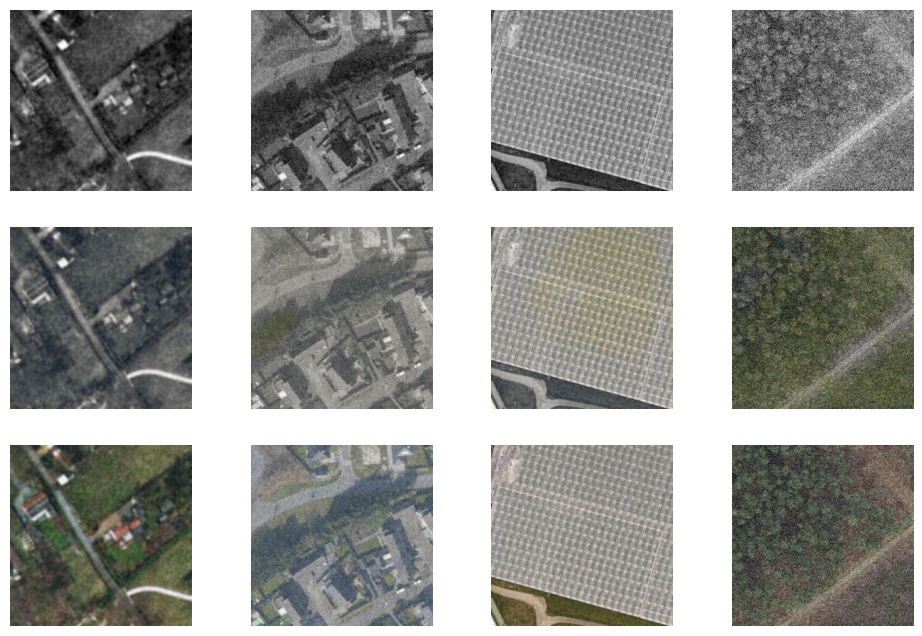


Epoch 5/5
loss_D_fake: 0.5397
loss_D_real: 0.5357
loss_D: 0.5377
loss_G_GAN: 1.1587
loss_G_L1: 4.5650
loss_G: 5.7236


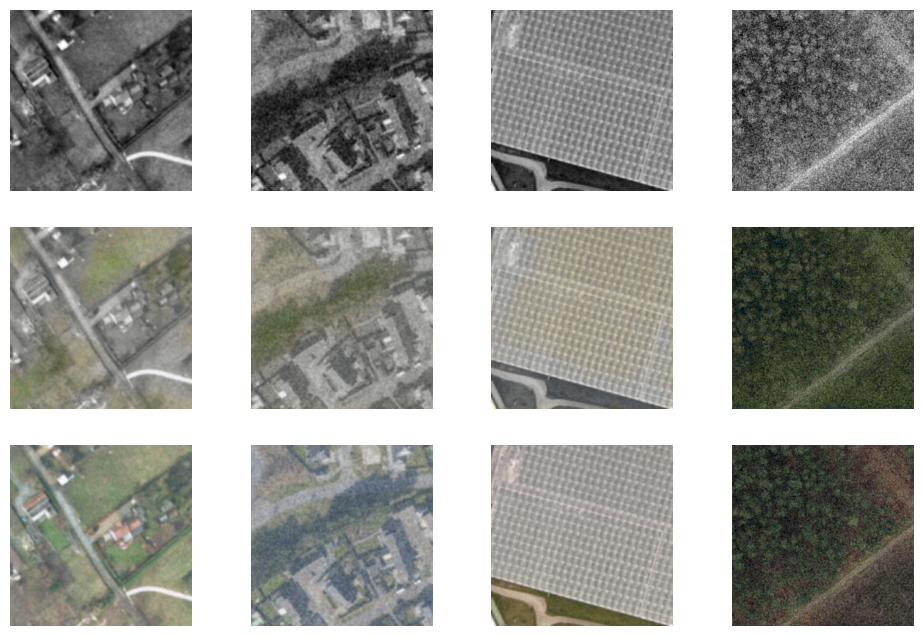

In [125]:
train_model(model, pretrain_dl, 5)
model.eval()
torch.save(model.state_dict(), 'runs\\models\\testRun.pth')

# Inference

## training in production: 

To reduce memory use we use Half-precision floating-point tensors and we also use [Huggingface accelerate][0] to speed up training.
This also allows us to train on multiple GPU's. 

To get good 

[0]: https://huggingface.co/docs/accelerate/

In [1]:
import torch, numpy as np, matplotlib.pyplot as plt
from osgeo import gdal
gdal.UseExceptions()
from model.unet import ResUnet
from model.tools import lab_to_rgb

device =  torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

c:\Users\admin\miniconda3\envs\fastai\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


device(type='cuda')

In [3]:
W= r".\runs\models\color_run31_resnet50_512_net_G08.pth"
model= ResUnet( size=512 , timm_model_name='resnet50') 
model.to(device)
model.load_state_dict( torch.load(W, map_location=device ) )

<All keys matched successfully>

In [ ]:
imsize = 512
# two large scale black&white orthophoto mosaics of southern Antwerp: 
ds0 = gdal.Open( r"W:\\1970\\OKZPAN71VL_K15.jp2" )      # 1970  1m resolution
ds1 = gdal.Open( r"W:\\1948-1968\\1948antwZuid.tif" )   # 1948  1m resolution

# pick a random place on the photo's of 512x512 pixels
ds0_img = ds0.GetRasterBand(1).ReadAsArray(
    xoff= np.random.randint(ds0.RasterXSize - imsize), 
    yoff= np.random.randint(ds0.RasterYSize - imsize), 
    win_xsize=imsize, win_ysize=imsize) 

ds1_img = ds1.GetRasterBand(1).ReadAsArray(
    xoff= np.random.randint(ds1.RasterXSize - imsize), 
    yoff= np.random.randint(ds1.RasterYSize - imsize), 
    win_xsize=imsize, win_ysize=imsize) 

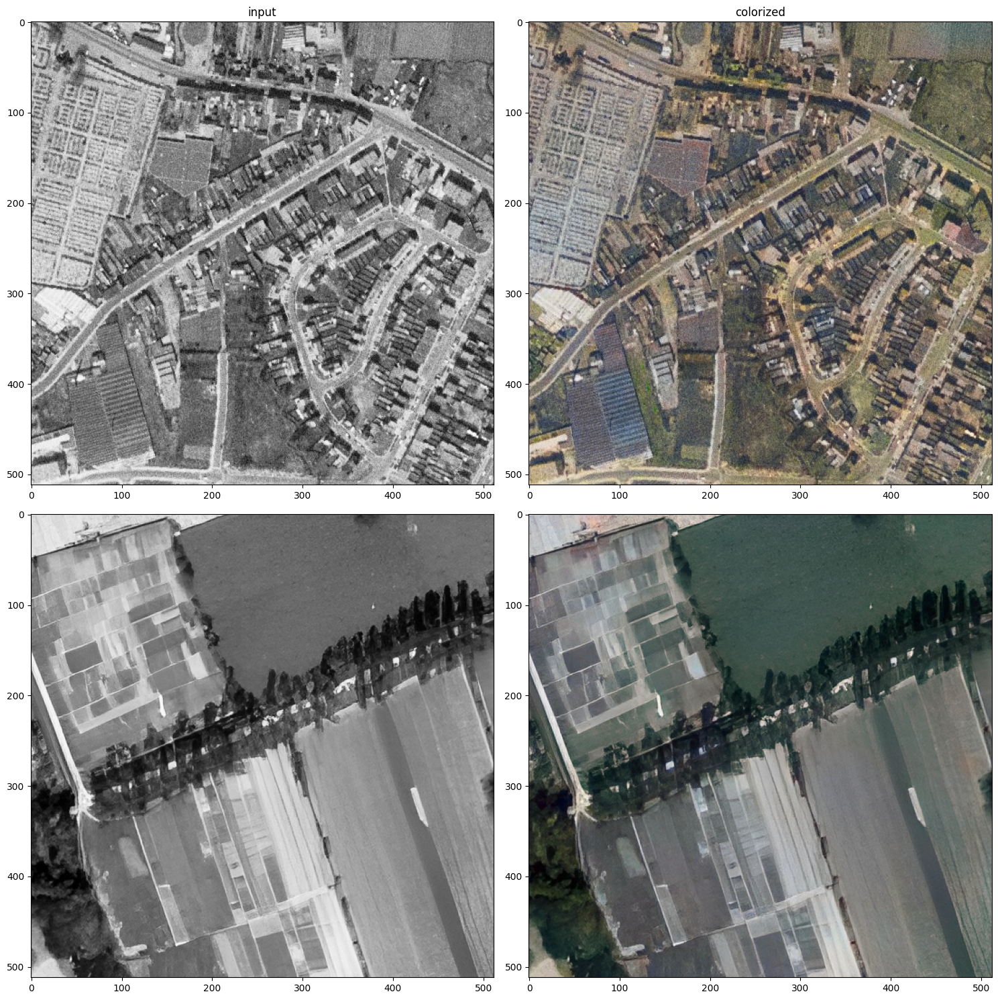

In [12]:
g0_img = torch.Tensor( ( ds0_img /128) -1 ).unsqueeze(0)
g1_img = torch.Tensor( ( ds1_img /128) -1 ).unsqueeze(0)

with torch.inference_mode():
    pred0 = model(g0_img.unsqueeze(0).to(device) )
    pred1 = model(g1_img.unsqueeze(0).to(device) )
 
colorized0 = lab_to_rgb(g0_img.unsqueeze(0), pred0.cpu())[0]
colorized1 = lab_to_rgb(g1_img.unsqueeze(0), pred1.cpu())[0]

f , axs = plt.subplots(2,2)
axs[0,0].imshow(g0_img[0], cmap='Greys_r')
axs[0,0].set_title('input')
axs[0,1].imshow(colorized0)
axs[0,1].set_title("colorized")
axs[1,0].imshow(g1_img[0], cmap='Greys_r')
axs[1,1].imshow(colorized1)
f.set_size_inches(15,15)
f.tight_layout()

In [11]:
from RealESRGAN import RealESRGAN
from PIL import Image
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [17]:
model4x = RealESRGAN(device, scale=2)
model4x.load_weights(r"V:\project\learn\Real-ESRGAN_hug\weights\RealESRGAN_x2.pth", download=False)

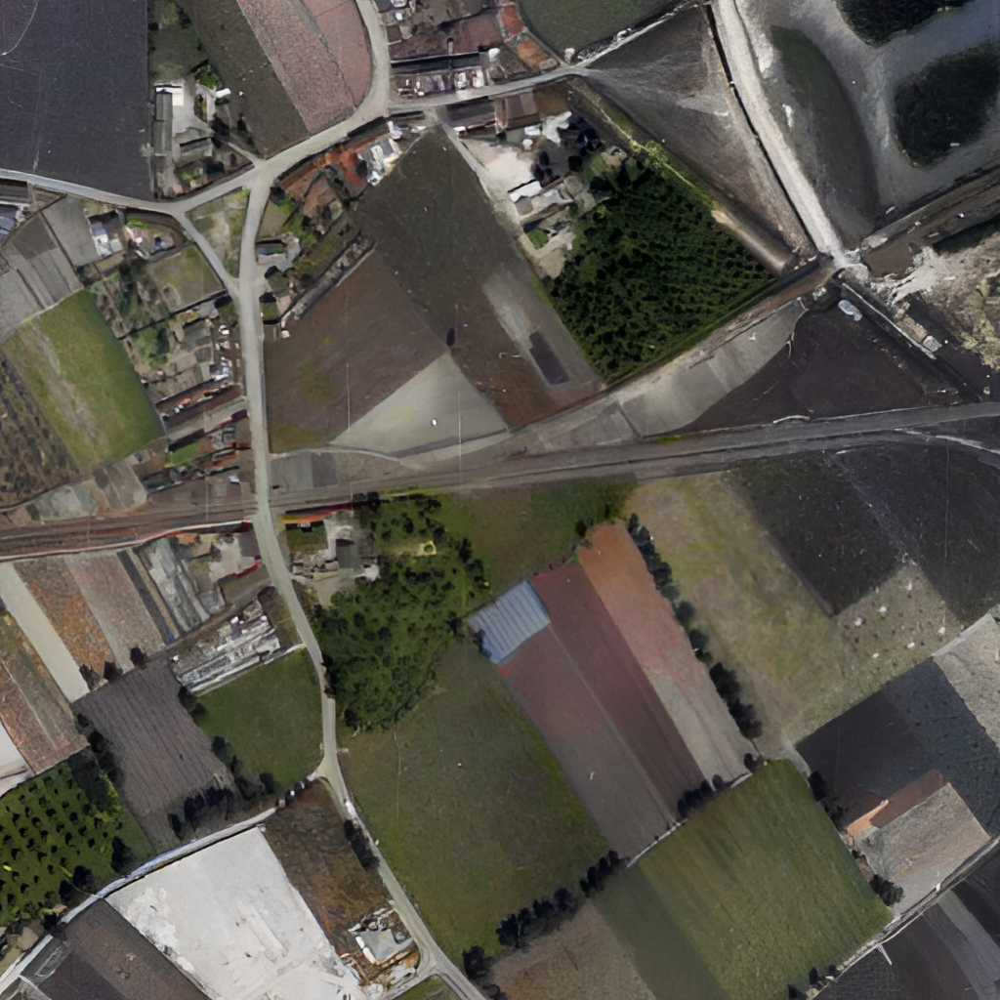

In [18]:
img= (colorized1*255).astype('uint8')
pred= model4x.predict_np(img)
Image.fromarray(pred)

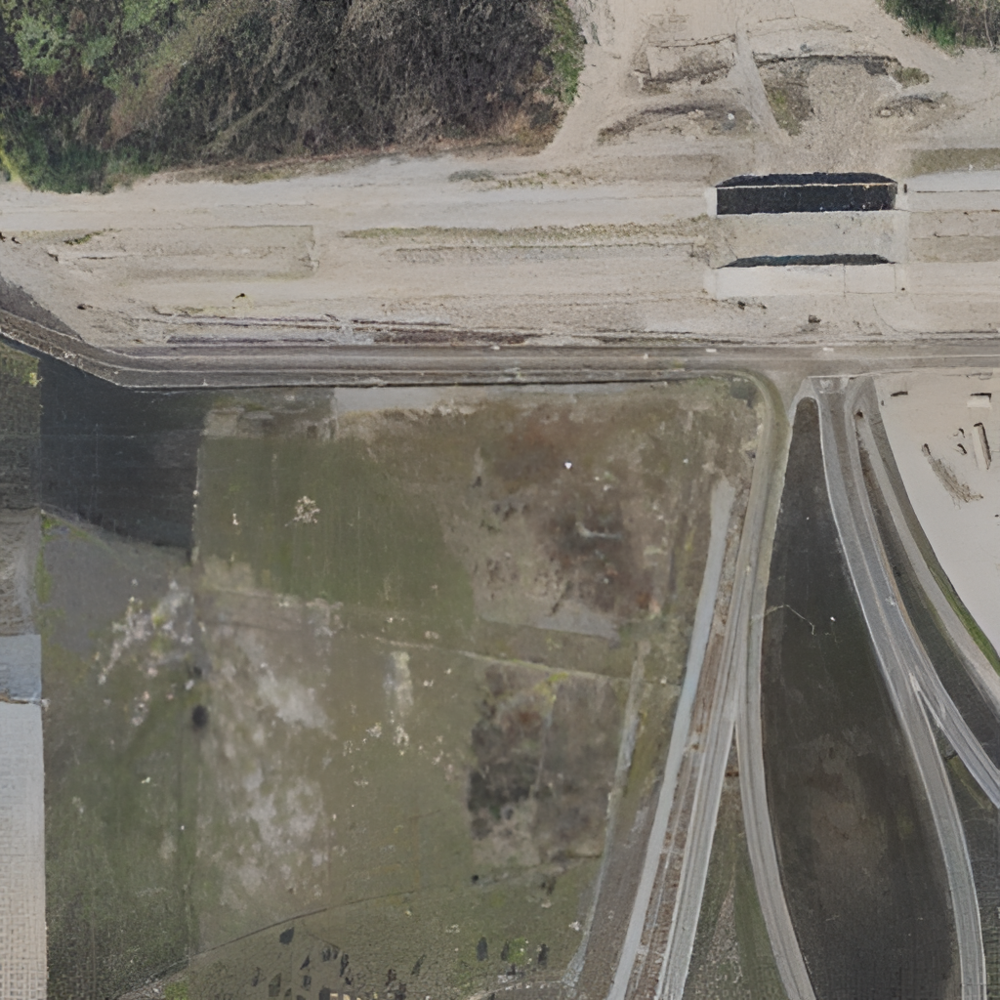

In [19]:
img= (colorized0*255).astype('uint8')
pred= model4x.predict_np(img)
Image.fromarray(pred)